In [221]:
import pandas as pd
import statsmodels.formula.api as smf

In [222]:
from matplotlib import pyplot


def show_metric_by_treatment(df, metric, hist_range, hist_bins, metric_name):
    pyplot.hist(
        df[df.treatment == 1][metric].values,
        label = 'treatment',
        alpha = 0.5, range = hist_range, bins = hist_bins,
        color = 'navy',
        weights = np.ones_like(df[df.treatment == 1].index)*100/df[df.treatment == 1].shape[0]
    )
    
    pyplot.hist(
        df[df.treatment == 0][metric].values,
        label = 'control',
        alpha = 0.5, range = hist_range, bins = hist_bins,
        color = 'red',
        weights = np.ones_like(df[df.treatment == 0].index)*100/df[df.treatment == 0].shape[0]
    )
    
    pyplot.legend(loc = 'upper right')
    pyplot.title('Distribution of %s' % metric_name)
    pyplot.xlabel('')
    pyplot.ylabel('share of users, %')
    pyplot.show()

In [223]:
pd.set_option('display.float_format', '{:.2f}'.format)

In [224]:
df = pd.read_csv('ops_experiment_synthetic_v2.csv')

In [225]:
df.head()

,case_id,agent_id,treatment,time_spent_mins,cs_center,complexity,tenure,passed_training,within_sla
0,1000,1,0,19.20,InnovativeSupport,medium,5,0,0
1,1001,1,0,15.14,InnovativeSupport,medium,5,0,0
2,1002,1,0,16.38,InnovativeSupport,medium,5,0,0
3,1003,1,0,17.81,InnovativeSupport,medium,5,0,0
4,1004,1,0,14.47,InnovativeSupport,medium,5,0,1


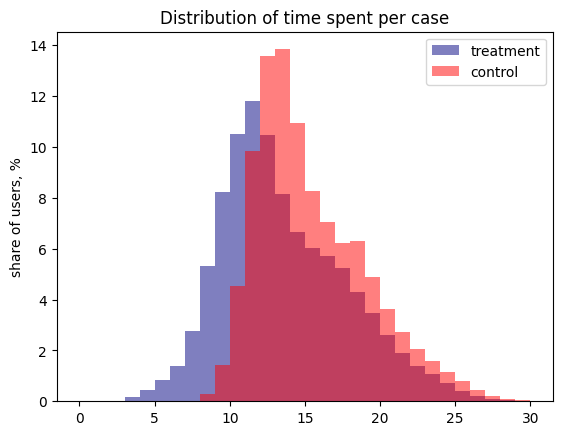

In [226]:
import numpy as np
show_metric_by_treatment(df, 'time_spent_mins', [0, 30], 30,
                        'time spent per case')

In [227]:
df.groupby('treatment').aggregate(
    {'case_id': 'count', 'agent_id': 'nunique', 'time_spent_mins': 'mean'}
)

,case_id,agent_id,time_spent_mins
treatment,,,
0,42130,426,15.46
1,47614,479,13.59


In [228]:
df.groupby('treatment').time_spent_mins.var()

treatment
0   13.67
1   17.62
Name: time_spent_mins, dtype: float64

In [229]:
comp_stats_df = df.groupby('complexity', as_index = False).aggregate({'case_id': 'nunique', 'time_spent_mins': ['mean', 'std']})
comp_stats_df.columns = ['complexity', 'cases', 'avg_time_spent_mins', 'std_time_spent_mins']
comp_stats_df['share'] = comp_stats_df.cases*100/comp_stats_df.cases.sum()
comp_stats_df.sort_values('cases', ascending = False)[[
    'complexity', 'cases', 'share', 'avg_time_spent_mins', 'std_time_spent_mins'
]]

,complexity,cases,share,avg_time_spent_mins,std_time_spent_mins
1,low,53872,60.03,12.00,2.28
2,medium,27495,30.64,17.08,2.57
0,high,8377,9.33,21.76,2.88


In [230]:
import plotly.io as pio
pio.templates.default = 'simple_white'
import plotly.express as px

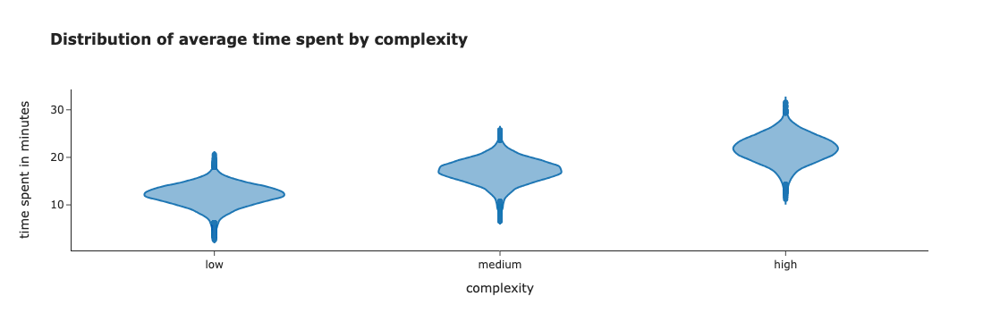

In [231]:
fig = px.violin(df, x="complexity", y="time_spent_mins", height = 600,
            category_orders={'complexity': ['low', 'medium', 'high']}, 
               title = '<b>Distribution of average time spent by complexity</b>',
               labels = {'time_spent_mins': 'time spent in minutes'})
fig.show()

In [232]:
control_values = df[df.treatment == 0].time_spent_mins.values
exp_values = df[df.treatment == 1].time_spent_mins.values

In [233]:
from scipy.stats import ttest_ind
ttest_ind(exp_values, control_values)

TtestResult(statistic=-70.2769283935386, pvalue=0.0, df=89742.0)

In [234]:
from scipy import stats
import numpy as np

# Calculate sample statistics
mean1, mean2 = np.mean(exp_values), np.mean(control_values)
std1, std2 = np.std(exp_values, ddof=1), np.std(control_values, ddof=1)
n1, n2 = len(exp_values), len(control_values)

# Calculate pooled standard deviation
pooled_std = np.sqrt(((n1 - 1) * std1**2 + (n2 - 1) * std2**2) / (n1 + n2 - 2))

# Determine degrees of freedom
degrees_of_freedom = n1 + n2 - 2

# Set confidence level (e.g., 95%)
confidence_level = 0.95

# Calculate margin of error
margin_of_error = stats.t.ppf((1 + confidence_level) / 2, degrees_of_freedom) * pooled_std * np.sqrt(1 / n1 + 1 / n2)

# Calculate confidence interval
mean_difference = mean1 - mean2
conf_interval = (mean_difference - margin_of_error, mean_difference + margin_of_error)

print("Confidence Interval:", list(map(lambda x: round(x, 3), conf_interval)))

Confidence Interval: [-1.918, -1.814]


In [235]:
model = smf.ols('time_spent_mins ~ treatment', data=df).fit()
model.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,15.4586,0.019,799.126,0.000,15.421,15.496
treatment,-1.8664,0.027,-70.277,0.000,-1.918,-1.814


In [236]:
time_model = smf.ols('time_spent_mins ~ complexity', data=df).fit()
print('Initial variance: %.2f, Residual variance after accounting for complexity: %.2f' % (df.time_spent_mins.var(), time_model.resid.var(),))

Initial variance: 16.63, Residual variance after accounting for complexity: 5.94


In [237]:
model = smf.ols('time_spent_mins ~ treatment + complexity', data=df).fit()
model.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,22.8369,0.026,880.146,0.000,22.786,22.888
complexity[T.low],-9.8183,0.026,-372.409,0.000,-9.870,-9.767
complexity[T.medium],-4.7770,0.028,-170.490,0.000,-4.832,-4.722
treatment,-1.9060,0.015,-126.920,0.000,-1.935,-1.877


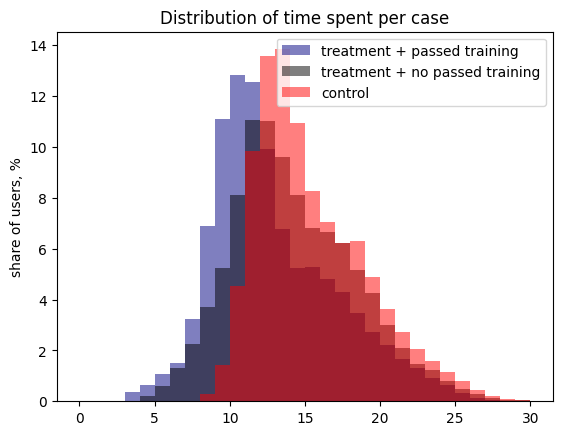

In [238]:
metric = 'time_spent_mins'
metric_name = 'time spent per case'
hist_range = [0, 30]
hist_bins = 30

pyplot.hist(
    df[(df.treatment == 1) & (df.passed_training == 1)][metric].values,
    label = 'treatment + passed training',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'navy',
    weights = np.ones_like( df[(df.treatment == 1) & (df.passed_training == 1)].index)*100/ df[(df.treatment == 1) & (df.passed_training == 1)].shape[0]
)

pyplot.hist(
    df[(df.treatment == 1) & (df.passed_training == 0)][metric].values,
    label = 'treatment + no passed training',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'black',
    weights = np.ones_like(df[(df.treatment == 1) & (df.passed_training == 0)].index)*100/ df[(df.treatment == 1) & (df.passed_training == 0)].shape[0]
)

pyplot.hist(
    df[df.treatment == 0][metric].values,
    label = 'control',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'red',
    weights = np.ones_like(df[df.treatment == 0].index)*100/df[df.treatment == 0].shape[0]
)

pyplot.legend(loc = 'upper right')
pyplot.title('Distribution of %s' % metric_name)
pyplot.xlabel('')
pyplot.ylabel('share of users, %')
pyplot.show()

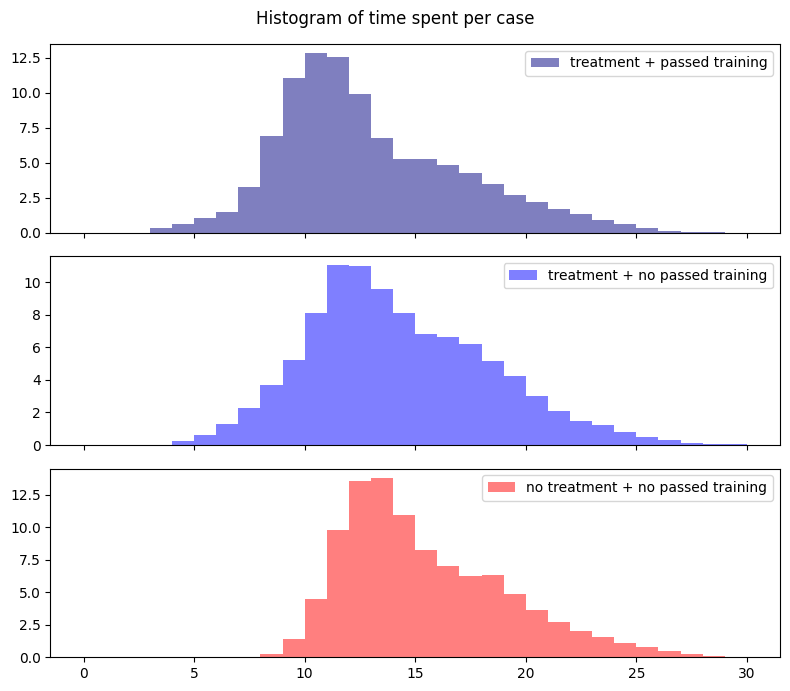

In [239]:
metric = 'time_spent_mins'
metric_name = 'time spent per case'
hist_range = [0, 30]
hist_bins = 30

fig, axs = pyplot.subplots(3, 1, sharex=True, tight_layout=True,
                          figsize=(8, 7))

axs[0].hist(
    df[(df.treatment == 1) & (df.passed_training == 1)][metric].values,
    label = 'treatment + passed training',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'navy',
    weights = np.ones_like( df[(df.treatment == 1) & (df.passed_training == 1)].index)*100/ df[(df.treatment == 1) & (df.passed_training == 1)].shape[0]
)

axs[1].hist(
    df[(df.treatment == 1) & (df.passed_training == 0)][metric].values,
    label = 'treatment + no passed training',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'blue',
    weights = np.ones_like(df[(df.treatment == 1) & (df.passed_training == 0)].index)*100/ df[(df.treatment == 1) & (df.passed_training == 0)].shape[0]
)

axs[2].hist(
    df[(df.treatment == 0) & (df.passed_training == 0)][metric].values,
    label = 'no treatment + no passed training',
    alpha = 0.5, range = hist_range, bins = hist_bins,
    color = 'red',
    weights = np.ones_like( df[(df.treatment == 0) & (df.passed_training == 0)].index)*100/ df[(df.treatment == 0) & (df.passed_training == 0)].shape[0]
)

# Adding legend
for ax in axs:
    ax.legend()

# Adding title
fig.suptitle('Histogram of ' + metric_name)

pyplot.show()

In [241]:
stats_df = df.groupby(['treatment', 'passed_training'], as_index = False).aggregate(
    {'case_id': 'count', 'time_spent_mins': 'mean'}
)

stats_df['share'] = stats_df.case_id*100/stats_df.case_id.sum()
stats_df

,treatment,passed_training,case_id,time_spent_mins,share
0,0,0,42130,15.46,46.94
1,1,0,23377,14.27,26.05
2,1,1,24237,12.94,27.01


In [191]:
model = smf.ols('time_spent_mins ~ treatment * passed_training + complexity', data=df).fit()
model.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,22.8969,0.028,826.014,0.000,22.843,22.951
complexity[T.low],-9.8469,0.026,-380.859,0.000,-9.898,-9.796
complexity[T.medium],-4.8515,0.027,-176.440,0.000,-4.905,-4.798
treatment,-1.3069,0.021,-62.460,0.000,-1.348,-1.266
passed_training,-0.0388,0.021,-1.807,0.071,-0.081,0.003
treatment:passed_training,-1.1785,0.029,-39.967,0.000,-1.236,-1.121


In [252]:
def get_tenure_bucket(tenure):
    if tenure <= 3:
        return '0 - 3 months'
    if tenure <= 6:
        return '4 - 6 months'
    if tenure <= 12:
        return '7 - 12 months'
    if tenure <= 24:
        return '1 - 2 years'
    if tenure <= 36:
        return '2 - 3 years'
    return '3+ years'


df['tenure_bucket'] = df.tenure.map(get_tenure_bucket)

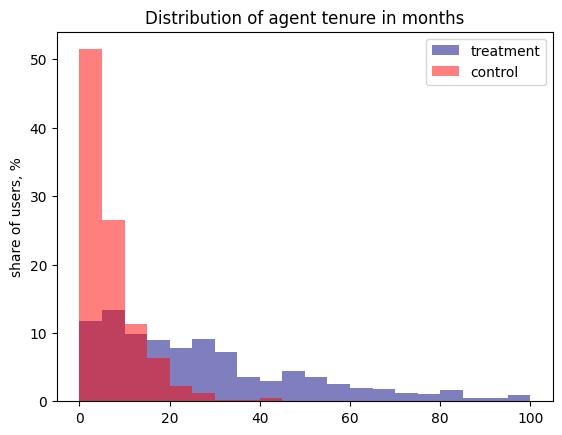

In [246]:
show_metric_by_treatment(df, 'tenure', [0, 100], 20, 'agent tenure in months')

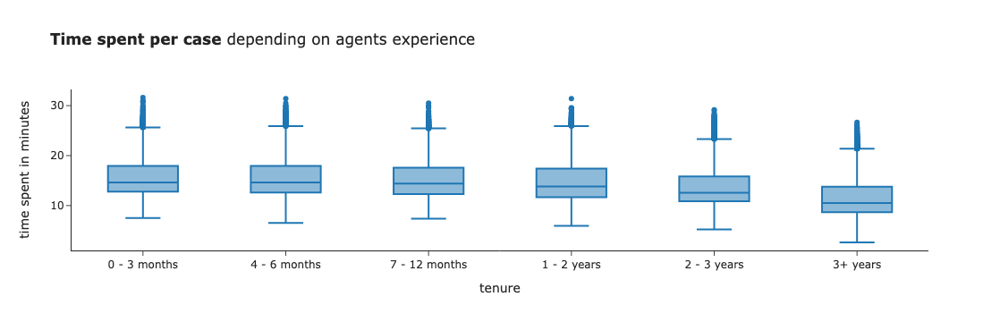

In [259]:
px.box(df, x = 'tenure_bucket', y = 'time_spent_mins', title = '<b>Time spent per case</b> depending on agents experience',
       labels = {'time_spent_mins': 'time spent in minutes', 'tenure_bucket': 'tenure'}, height = 500,
      category_orders={'tenure_bucket': ['0 - 3 months', '4 - 6 months', '7 - 12 months', '1 - 2 years', 
                                        '2 - 3 years', '3+ years']})

In [192]:
model = smf.ols('time_spent_mins ~ treatment * passed_training + complexity + tenure', data=df).fit()
model.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,23.2154,0.023,1008.292,0.000,23.170,23.261
complexity[T.low],-9.8015,0.021,-457.452,0.000,-9.843,-9.759
complexity[T.medium],-4.8586,0.023,-213.230,0.000,-4.903,-4.814
treatment,0.0163,0.019,0.879,0.380,-0.020,0.053
passed_training,-0.0227,0.018,-1.279,0.201,-0.058,0.012
treatment:passed_training,-1.0660,0.024,-43.616,0.000,-1.114,-1.018
tenure,-0.0542,0.000,-202.344,0.000,-0.055,-0.054


In [183]:
df.head()

,case_id,agent_id,treatment,time_spent_mins,cs_center,complexity,tenure,passed_training,within_sla
0,1000,1,0,19.20,InnovativeSupport,medium,5,0,0
1,1001,1,0,15.14,InnovativeSupport,medium,5,0,0
2,1002,1,0,16.38,InnovativeSupport,medium,5,0,0
3,1003,1,0,17.81,InnovativeSupport,medium,5,0,0
4,1004,1,0,14.47,InnovativeSupport,medium,5,0,1


In [261]:
model = smf.ols('time_spent_mins ~ treatment + complexity + tenure', data=df[df.treatment == df.passed_training]).fit()
model.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,23.1120,0.024,968.546,0.000,23.065,23.159
complexity[T.low],-9.6922,0.025,-391.929,0.000,-9.741,-9.644
complexity[T.medium],-4.7823,0.026,-180.787,0.000,-4.834,-4.730
treatment,-1.0711,0.018,-60.536,0.000,-1.106,-1.036
tenure,-0.0538,0.000,-147.296,0.000,-0.055,-0.053


In [260]:
model = smf.ols('time_spent_mins ~ treatment + complexity + tenure + within_sla', data=df[df.treatment == df.passed_training]).fit()
model.summary().tables[1]

,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,22.8877,0.021,1104.833,0.000,22.847,22.928
complexity[T.low],-6.8505,0.029,-238.810,0.000,-6.907,-6.794
complexity[T.medium],-4.2255,0.023,-182.077,0.000,-4.271,-4.180
treatment,-0.8321,0.015,-54.019,0.000,-0.862,-0.802
tenure,-0.0435,0.000,-134.357,0.000,-0.044,-0.043
within_sla,-3.1555,0.021,-148.861,0.000,-3.197,-3.114


In [270]:
agents_df = df.groupby(['agent_id', 'treatment', 'complexity', 'tenure', 'passed_training'], as_index = False).aggregate(
    {'case_id': 'nunique', 'time_spent_mins': 'mean'}
)

In [276]:
model = smf.ols('time_spent_mins ~ treatment + complexity + tenure', data=agents_df[agents_df.treatment == agents_df.passed_training],
               weights = agents_df[agents_df.treatment == agents_df.passed_training]['case_id']).fit()
model.summary().tables[1]

/Users/marie/Documents/github/llm_env/lib/python3.9/site-packages/statsmodels/regression/linear_model.py:922: ValueWarning:

Weights are not supported in OLS and will be ignoredAn exception will be raised in the next version.

/Users/marie/Documents/github/llm_env/lib/python3.9/site-packages/statsmodels/base/model.py:130: ValueWarning:

unknown kwargs ['weights']



,coef,std err,t,P>|t|,[0.025,0.975]
Intercept,23.1716,0.133,174.181,0.000,22.910,23.433
complexity[T.low],-9.7563,0.139,-70.259,0.000,-10.029,-9.484
complexity[T.medium],-4.8526,0.148,-32.834,0.000,-5.143,-4.562
treatment,-1.0692,0.099,-10.811,0.000,-1.263,-0.875
tenure,-0.0529,0.002,-26.305,0.000,-0.057,-0.049


In [273]:
agents_df.groupby(['passed_training', 'treatment'], as_index = False).time_spent_mins.mean()

,passed_training,treatment,time_spent_mins
0,0,0,15.54
1,0,1,14.31
2,1,1,13.02
